In [26]:
import yellowcab as yc
import matplotlib.pyplot as plt
import pandas as pd
import contextily as ctx
import seaborn as sns
import geopandas as gpd
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable
sns.set(style="darkgrid")
%matplotlib inline

In [57]:
# Read in geodata
gdf = yc.io.read_all_files('geojson')

# Read in preprocessed trip_data
trip_data = yc.io.read_all_files('parquet')
trip_data

,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,...,start_location_long,start_location_lat,end_location_long,end_location_lat,PUBorough,PUZone,PUservice_zone,DOBorough,DOZone,DOservice_zone
0,2020-01-01 00:29:01,2020-01-01 00:40:28,2.0,0.70,1.0,246,48,1.0,8.0,3.0,...,-73.941399,40.841709,-73.962364,40.687967,Manhattan,West Chelsea/Hudson Yards,Yellow Zone,Manhattan,Clinton East,Yellow Zone
1,2020-01-01 00:50:58,2020-01-01 01:06:09,1.0,1.39,1.0,246,48,2.0,10.0,0.5,...,-73.941399,40.841709,-73.962364,40.687967,Manhattan,West Chelsea/Hudson Yards,Yellow Zone,Manhattan,Clinton East,Yellow Zone
2,2020-01-01 00:24:18,2020-01-01 00:52:47,1.0,2.15,99.0,246,48,2.0,17.0,0.5,...,-73.941399,40.841709,-73.962364,40.687967,Manhattan,West Chelsea/Hudson Yards,Yellow Zone,Manhattan,Clinton East,Yellow Zone
3,2020-01-01 00:40:58,2020-01-01 00:51:25,1.0,0.50,1.0,246,48,1.0,7.5,3.0,...,-73.941399,40.841709,-73.962364,40.687967,Manhattan,West Chelsea/Hudson Yards,Yellow Zone,Manhattan,Clinton East,Yellow Zone
4,2020-01-01 00:47:46,2020-01-01 01:03:04,1.0,1.29,1.0,246,48,2.0,10.0,0.5,...,-73.941399,40.841709,-73.962364,40.687967,Manhattan,West Chelsea/Hudson Yards,Yellow Zone,Manhattan,Clinton East,Yellow Zone
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7375514,2020-02-29 08:10:41,2020-02-29 08:34:28,1.0,12.04,1.0,132,2,2.0,35.5,0.0,...,-73.968168,40.797962,-73.847422,40.864474,Queens,JFK Airport,Airports,Queens,Jamaica Bay,Boro Zone
7375515,2020-07-15 14:59:45,2020-07-15 15:31:18,1.0,12.86,1.0,132,2,2.0,37.0,0.0,...,-73.968168,40.797962,-73.847422,40.864474,Queens,JFK Airport,Airports,Queens,Jamaica Bay,Boro Zone
7375516,2020-02-05 14:15:01,2020-02-05 15:25:56,1.0,0.00,1.0,65,2,1.0,52.2,0.0,...,-73.922251,40.652365,-73.847422,40.864474,Brooklyn,Downtown Brooklyn/MetroTech,Boro Zone,Queens,Jamaica Bay,Boro Zone
7375517,2020-09-25 21:32:15,2020-09-25 22:23:35,2.0,22.88,1.0,65,2,1.0,66.0,0.5,...,-73.922251,40.652365,-73.847422,40.864474,Brooklyn,Downtown Brooklyn/MetroTech,Boro Zone,Queens,Jamaica Bay,Boro Zone


In [3]:
# old heatmap function
def heatmap(trip_data, gdf, location='PULocationID', count_by="duration", group_type='sum', borough='Brooklyn', mapname="heatmap", file_type='png', figsize=10, title_fontsize=18):

    gdf = gdf[gdf['borough'] == borough]
    
    if group_type == 'sum':
        data_By = trip_data.groupby(location).sum()[[count_by]].reset_index().rename({location:"location_id"}, axis=1)
    elif group_type == 'mean':
        data_By = trip_data.groupby(location).mean()[[count_by]].reset_index().rename({location:"location_id"}, axis=1)
    elif group_type == 'min':
        data_By = trip_data.groupby(location).min()[[count_by]].reset_index().rename({location:"location_id"}, axis=1)
    elif group_type == 'max':
        data_By = trip_data.groupby(location).max()[[count_by]].reset_index().rename({location:"location_id"}, axis=1)
    elif group_type == 'count':
        data_By = trip_data.groupby(location).count()[[count_by]].reset_index().rename({location:"location_id"}, axis=1)
    else:
        raise ValueError('Error with group_type. Please choose either sum, mean, min or max')
            
    gdf['location_id'] = pd.to_numeric(gdf["location_id"])
    data_heat = pd.merge(gdf, data_By, right_index=True, left_on="location_id", how="left").set_index("location_id_x")
    data_heat = data_heat.reset_index().rename({"location_id_x":"location_id"}, axis=1).drop(['location_id_y', 'objectid'], axis=1)
    figsize_t = (figsize, figsize)
    fig, ax = plt.subplots(1, 1, figsize=figsize_t)
    
    title = 'The '+count_by+' grouped by '+group_type+' and applies to '+location
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)
    data_heat.apply(
    lambda x: ax.annotate(text=x["location_id"], xy=x.geometry.centroid.coords[0], ha='center', fontsize=figsize-1, weight='bold', color='grey'), axis=1)

    data_heat.plot(column=count_by, ax=ax, legend=True, cax=cax)
    ax.set_title(title, fontsize=title_fontsize)

    yc.io.save_fig(fig, mapname, file_type)
    return

In [90]:
# creating multiple heatmaps each with PU and DO Loc by trip_distance and duration
def create_all_heatmaps(trip_data, gdf, group_type='count', borough='Brooklyn',
            file_type='svg', basemap=True, vis_data=True, bubbles=True, 
            figsize=15, title_fontsize=25):
    
    heatmap(trip_data, gdf, count_by='duration', location='DOLocationID', borough=borough, 
            file_type=file_type, figsize=figsize, title_fontsize=title_fontsize, 
            group_type=group_type, basemap=basemap, vis_data=vis_data, bubbles=bubbles)
    print('1. heatmap processed')
    heatmap(trip_data, gdf, count_by='duration', location='PULocationID', borough=borough, 
            file_type=file_type, figsize=figsize, title_fontsize=title_fontsize, 
            group_type=group_type, basemap=basemap, vis_data=vis_data, bubbles=bubbles)
    print('2. heatmap processed')
    heatmap(trip_data, gdf, count_by='trip_distance', location='DOLocationID', borough=borough,
            file_type=file_type, figsize=figsize, title_fontsize=title_fontsize, 
            group_type=group_type, basemap=basemap, vis_data=vis_data, bubbles=bubbles)
    print('3. heatmap processed')
    heatmap(trip_data, gdf, count_by='trip_distance', location='PULocationID', borough=borough, 
            file_type=file_type, figsize=figsize, title_fontsize=title_fontsize, 
            group_type=group_type, basemap=basemap, vis_data=vis_data, bubbles=bubbles)
    print('4. heatmap processed')
    
    return

1. heatmap processed
2. heatmap processed
3. heatmap processed
4. heatmap processed
1. heatmap processed
2. heatmap processed
3. heatmap processed
4. heatmap processed
1. heatmap processed
2. heatmap processed
3. heatmap processed
4. heatmap processed


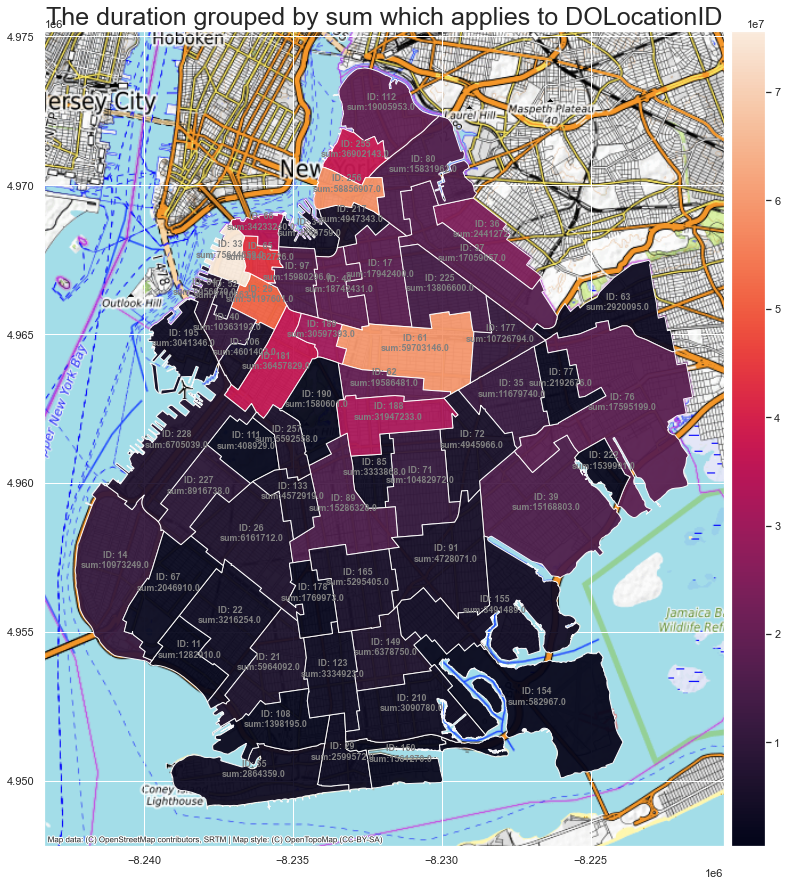

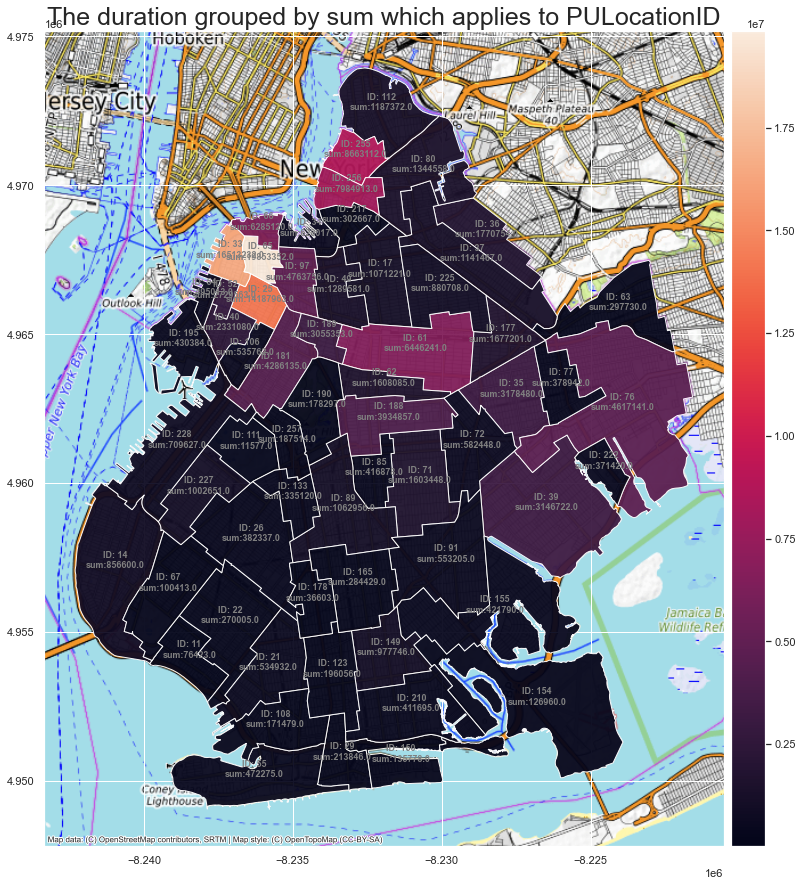

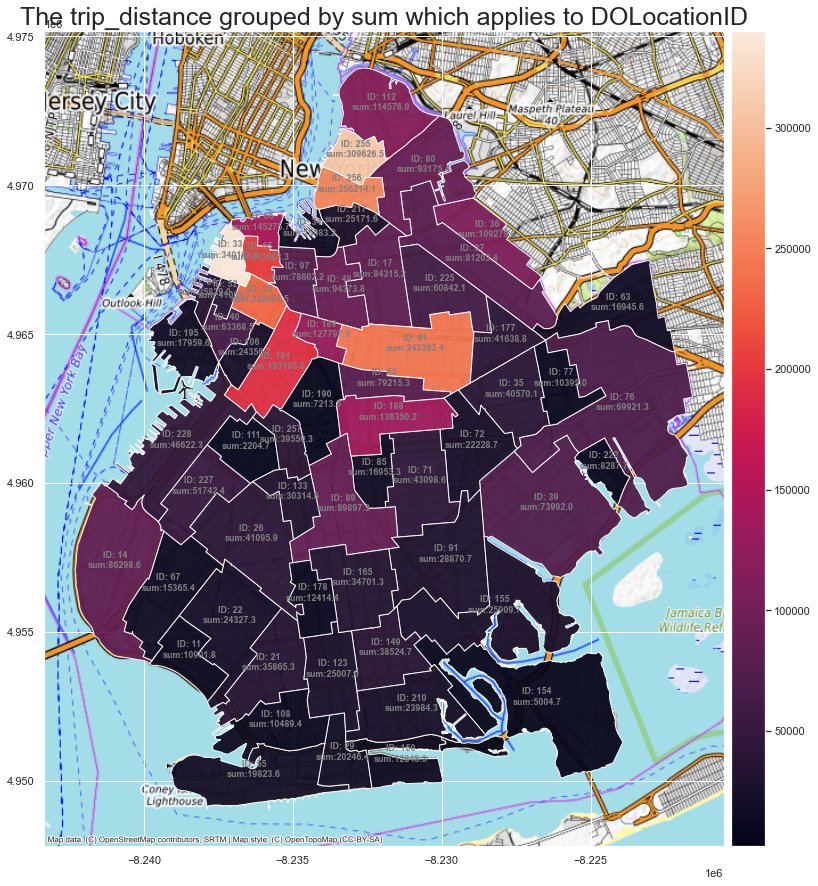

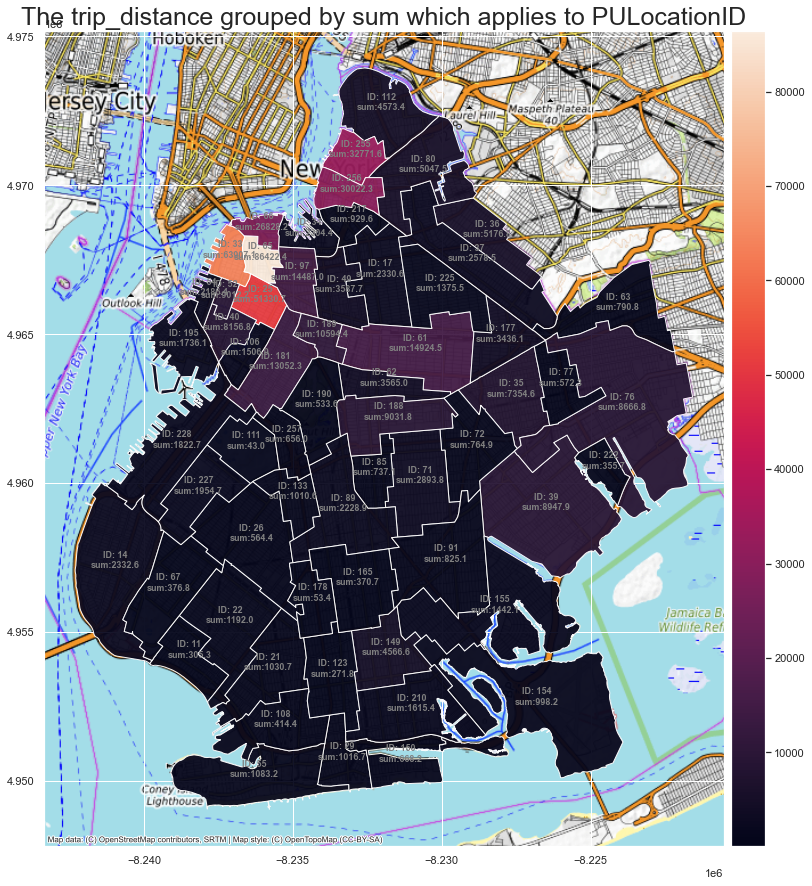

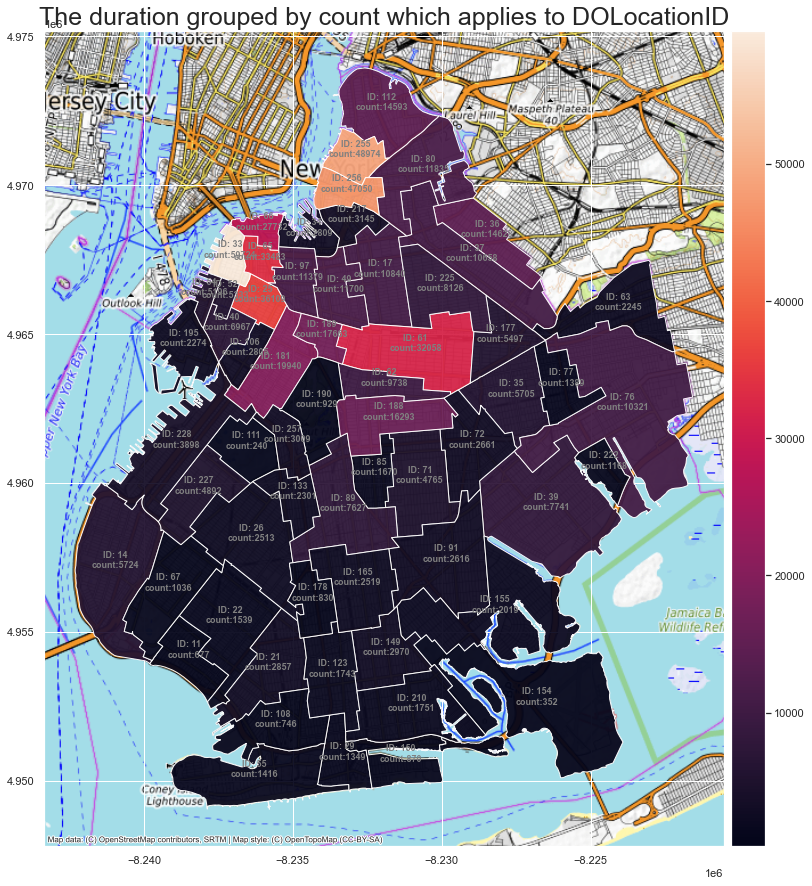

...

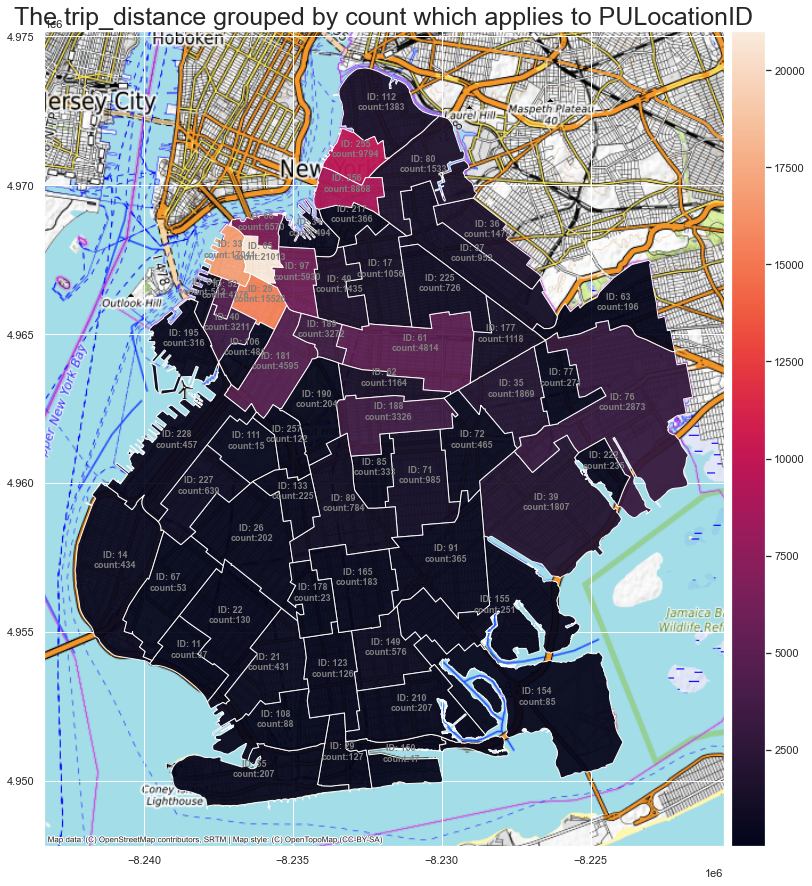

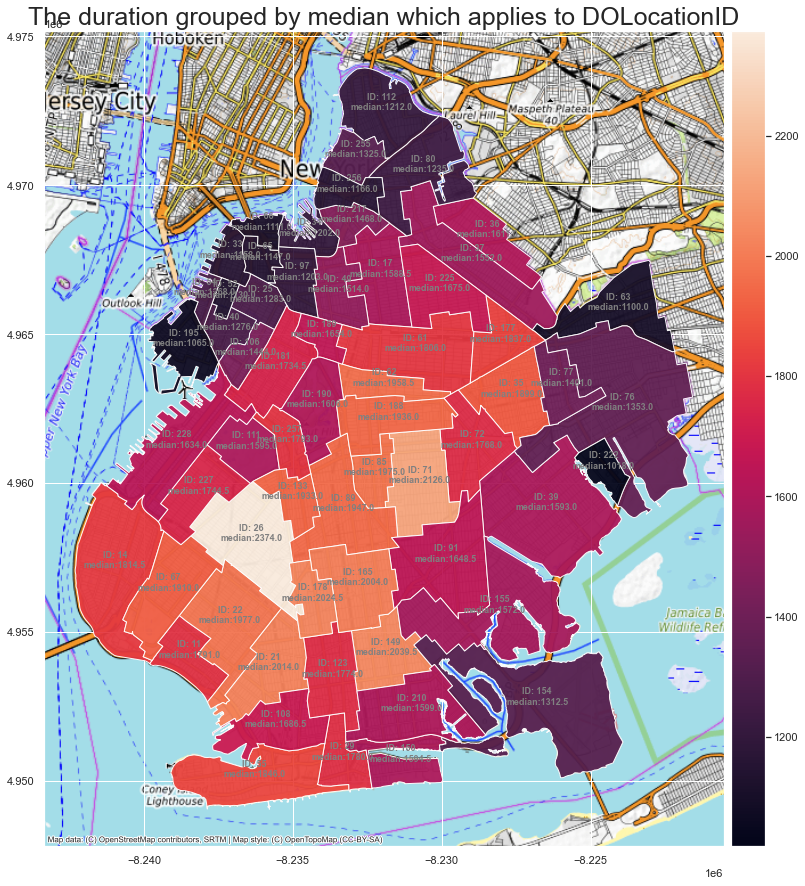

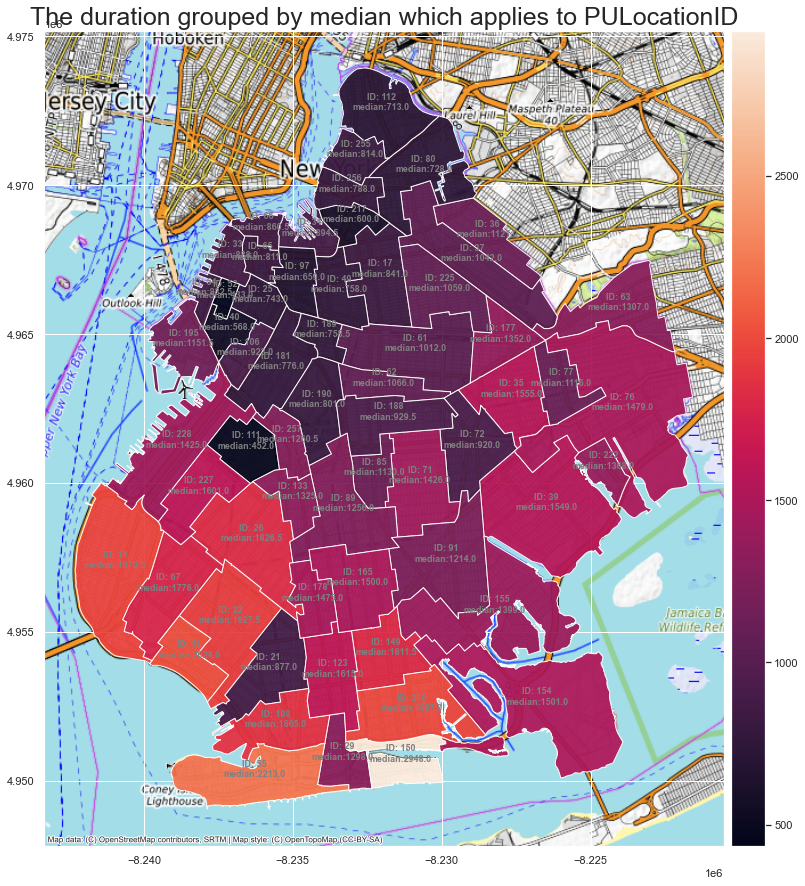

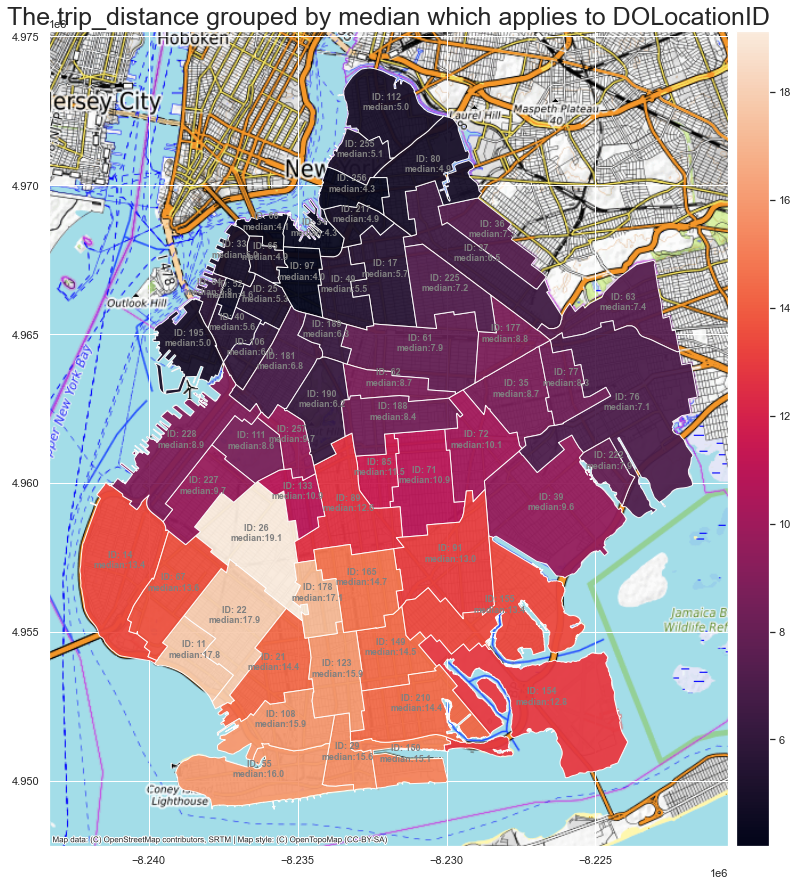

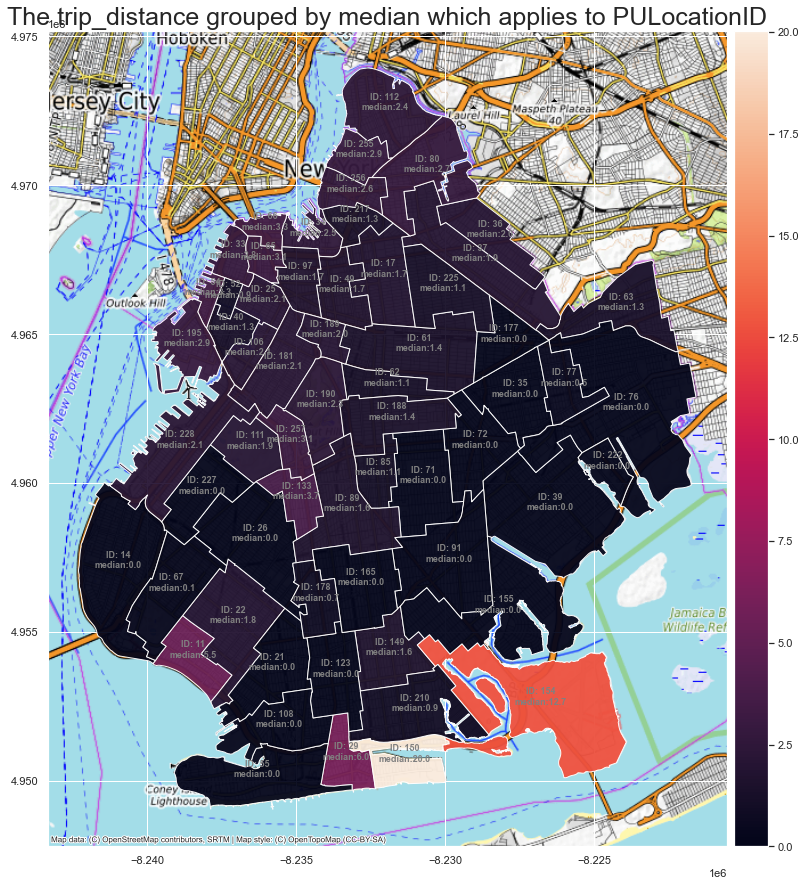

In [92]:
# output the most used types of heatmaps: PULoc and DOLoc each by trip_distance and duration
#yc.vis.create_all_heatmaps(trip_data_edit, gdf, group_type='mean')
create_all_heatmaps(trip_data, gdf, group_type='sum', bubbles=False)
create_all_heatmaps(trip_data, gdf, group_type='count', bubbles=False)
create_all_heatmaps(trip_data, gdf, group_type='median', bubbles=False)

In [93]:
# update heatmap to vis. trip amount
def heatmap(trip_data, gdf, location='PULocationID', count_by="duration",
            group_type='sum', borough='Brooklyn', file_type='png',
            figsize=15, title_fontsize=25, vis_data=False, bubbles=False, basemap=True):
    # filter the right dfs for higher performance
    gdf = gdf.to_crs(3857)[gdf['borough'] == borough]
    if location == 'PULocationID':
        trip_data = trip_data[trip_data['PUBorough'] == borough]
    elif location == 'DOLocationID':
        trip_data = trip_data[trip_data['DOBorough'] == borough]
    else:
        raise ValueError('Filter-Error')

    # groups data by count_by method
    data_By = getattr(trip_data.groupby(location), group_type)()[[count_by]].reset_index().rename(
        {location: "location_id"}, axis=1)

    # join gdf and trip_data -Frames
    gdf['location_id'] = pd.to_numeric(gdf["location_id"])
    data_heat = pd.merge(gdf, data_By, on="location_id")

    # create fig
    figsize_t = (figsize, figsize)
    fig, ax = plt.subplots(1, 1, figsize=figsize_t)
    title = 'The ' + count_by + ' grouped by ' + group_type + ' which applies to ' + location
    ax.set_title(title, fontsize=title_fontsize)

    # fits legend bar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)

    # vis. trip amount on map
    if not vis_data:
        data_heat.apply(
            lambda x: ax.annotate(text=x["location_id"], xy=x.geometry.centroid.coords[0],
                                  ha='center', fontsize=figsize - 1, weight='bold', color='grey'), axis=1)
    elif vis_data:
        data_heat.apply(
            lambda x: ax.annotate(
                text='ID: ' + str(x["location_id"]) + '\n' + group_type + ':' + str(round(x[count_by], 1)),
                xy=x.geometry.centroid.coords[0], ha='center', fontsize=figsize - 6, weight='bold', color='grey'),
            axis=1)
    else:
        raise ValueError('group_type must be set to ''count''')

    # plotting
    data_heat.plot(column=count_by, ax=ax, legend=True, cax=cax, alpha=0.95)

    # add basemap
    if basemap:
        ctx.add_basemap(ax, source=ctx.providers.OpenTopoMap)

    # creating bubbles
    if bubbles:
        gdf_points = data_heat.copy()
        gdf_points['geometry'] = gdf_points['geometry'].centroid
        gdf_points.plot(ax=ax, markersize=count_by, alpha=0.2, cmap='Reds', categorical=False, legend=True)

    mapname = 'heatmaps/' + count_by + '_g.by_' + group_type + '_from_' + location
    yellowcab.io.save_fig(fig, mapname, file_type)
    return data_heat

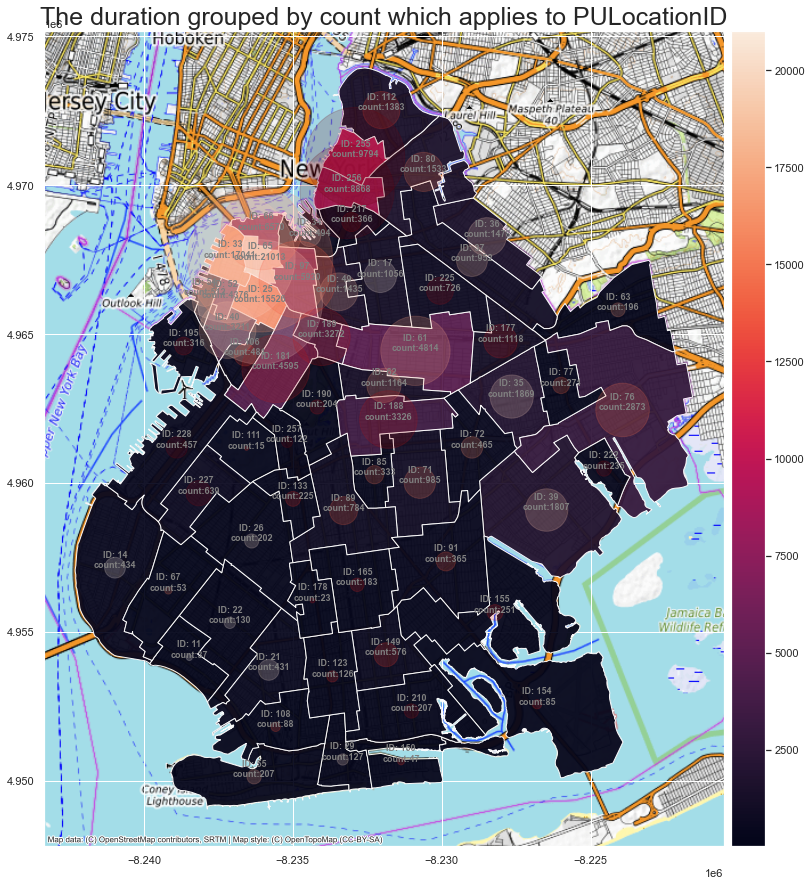

In [86]:
data_heat = heatmap(trip_data_edit_new, gdf, location='PULocationID', count_by='duration', group_type='count', 
                    basemap=True, vis_data=True, bubbles=True)

In [12]:
trip_data_edit_count = trip_data_edit.groupby('PULocationID').count()[['trip_distance']].reset_index().rename({'PULocationID':"location_id"}, axis=1)
trip_data_edit_count

,location_id,trip_distance
0,1,11
1,2,3
2,3,124
3,4,10802
4,5,11
...,...,...
253,259,78
254,260,2144
255,261,24595
256,262,39434


In [13]:
trip_data_edit_count[trip_data_edit_count['location_id']==91]

,location_id,trip_distance
89,91,365


In [14]:
trip_data_edit_count.sort_values(by='trip_distance', ascending=False)

,location_id,trip_distance
46,48,699644
127,132,590553
77,79,546116
103,107,538680
159,164,476539
...,...,...
57,59,4
105,109,3
26,27,3
1,2,3


In [32]:
trip_data_edit_new[trip_data_edit_new['PULocationID']==91]

,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,RatecodeID,PULocationID,DOLocationID,payment_type,fare_amount,extra,...,start_location_long,start_location_lat,end_location_long,end_location_lat,PUBorough,PUZone,PUservice_zone,DOBorough,DOZone,DOservice_zone
613207,2020-01-01 03:42:38,2020-01-01 04:22:55,1.0,14.07,1.0,91,48,2.0,44.5,0.5,...,-73.930097,40.626273,-73.962364,40.687967,Brooklyn,Flatlands,Boro Zone,Manhattan,Clinton East,Yellow Zone
613208,2020-01-02 07:19:23,2020-01-02 08:21:30,1.0,0.00,1.0,91,48,1.0,39.2,0.0,...,-73.930097,40.626273,-73.962364,40.687967,Brooklyn,Flatlands,Boro Zone,Manhattan,Clinton East,Yellow Zone
613209,2020-02-04 07:47:40,2020-02-04 09:07:47,1.0,0.00,1.0,91,48,1.0,34.2,0.0,...,-73.930097,40.626273,-73.962364,40.687967,Brooklyn,Flatlands,Boro Zone,Manhattan,Clinton East,Yellow Zone
613210,2020-05-31 02:24:24,2020-05-31 03:00:33,1.0,10.16,1.0,91,48,2.0,32.5,0.5,...,-73.930097,40.626273,-73.962364,40.687967,Brooklyn,Flatlands,Boro Zone,Manhattan,Clinton East,Yellow Zone
613211,2020-07-01 11:39:26,2020-07-01 12:42:12,1.0,0.00,1.0,91,48,1.0,53.2,0.0,...,-73.930097,40.626273,-73.962364,40.687967,Brooklyn,Flatlands,Boro Zone,Manhattan,Clinton East,Yellow Zone
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4077298,2020-11-17 16:16:45,2020-11-17 16:38:49,1.0,4.08,1.0,91,39,1.0,15.5,1.0,...,-73.930097,40.626273,-73.995956,40.679199,Brooklyn,Flatlands,Boro Zone,Brooklyn,Canarsie,Boro Zone
4077299,2020-11-20 15:34:42,2020-11-20 15:48:22,1.0,0.00,1.0,91,39,1.0,16.2,0.0,...,-73.930097,40.626273,-73.995956,40.679199,Brooklyn,Flatlands,Boro Zone,Brooklyn,Canarsie,Boro Zone
4077300,2020-12-08 11:21:32,2020-12-08 11:31:59,1.0,0.00,1.0,91,39,1.0,14.2,0.0,...,-73.930097,40.626273,-73.995956,40.679199,Brooklyn,Flatlands,Boro Zone,Brooklyn,Canarsie,Boro Zone
4077301,2020-12-16 12:16:53,2020-12-16 12:34:24,1.0,0.00,1.0,91,39,1.0,17.2,0.0,...,-73.930097,40.626273,-73.995956,40.679199,Brooklyn,Flatlands,Boro Zone,Brooklyn,Canarsie,Boro Zone


In [33]:
def add_namings(df, start_location="PULocationID", end_location="DOLocationID"):
    csv = yc.io.read_all_files('csv')
    
    csv_PU = csv.rename(
        {"LocationID": start_location, "Borough": "PUBorough", 'Zone':'PUZone', 
         'service_zone':'PUservice_zone'},
        axis=1)
    csv_DO = csv.rename(
        {"LocationID": end_location, "Borough": "DOBorough", 'Zone':'DOZone', 
         'service_zone':'DOservice_zone'},
        axis=1)
    
    df_new = pd.merge(df, csv_PU, on=start_location)
    df_new = pd.merge(df_new, csv_DO, on=end_location)

    return df_new